In [1]:
%load_ext autoreload
%autoreload 2

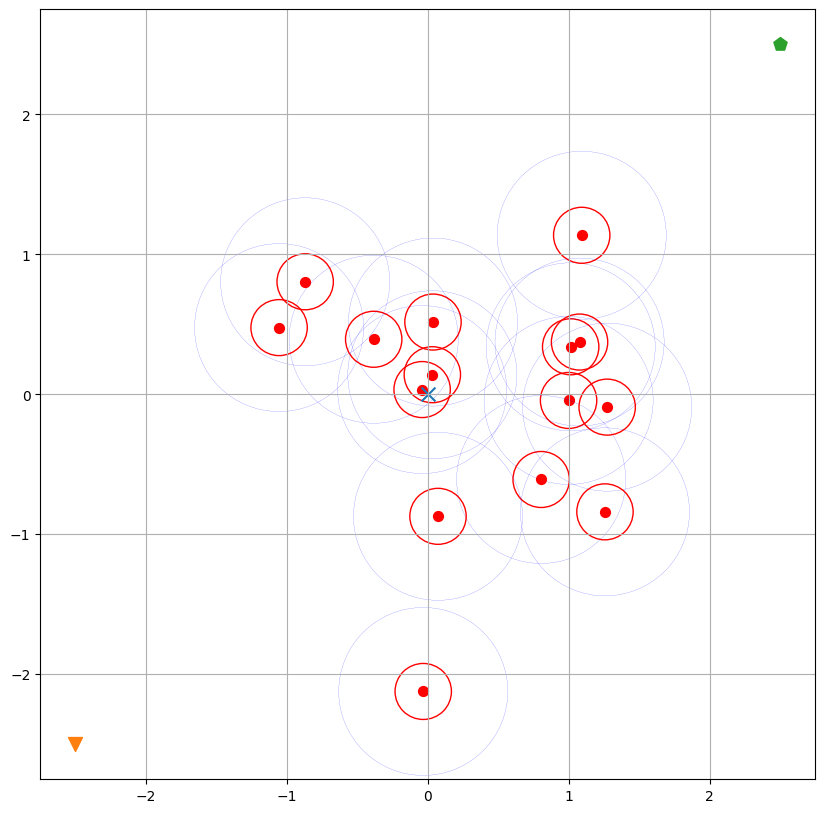

In [2]:
from tqdm import tqdm
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10,10))
num_points = 1
theta = 0

ax.grid(True)

minima, maxima = -5, 5

# Create a scatter plot
x1 = y1 = minima / 2
x2 = y2 = maxima / 2

n_problems = 15
radius = 0.2
for _ in range(n_problems):
    xc, yc = (np.random.normal(.0, 1), np.random.normal(.0, 1))   
    ax.scatter(xc, yc, s=50, color="red")
    ax.add_artist(
        plt.Circle((xc, yc), radius=radius, edgecolor='red', fill=False, linewidth=1, label='Circle around Point')
    )
    ax.add_artist(
        plt.Circle((xc, yc), radius=radius * 3, edgecolor='blue', fill=False, linewidth=0.1, label='Circle around Point')
    )

target = (0, 0)
sc0 = ax.scatter(target[0], target[1],  s=100, marker="x")
sc1 = ax.scatter(x1, y1, s=100, marker="v")
sc2 = ax.scatter(x2, y2, s=100, marker="p")

# Play

In [3]:
def dist(p1, p2):
    return math.sqrt(sum(abs(v1 - v2) ** 2 for v1, v2 in zip(p1, p2)))

In [4]:
from random import shuffle

import agent

# import importlib
# importlib.reload(agent)
# exp setup
n_plays = 10


# env setup
eps = 0.1
max_actions_per_play = 100

# for _ in range(3):
#     importlib.reload(agent)
#     a1 = agent.Agent1("a1")
#     a2 = agent.Agent2("a2")
#     print(a1.name)
#     print(a2.name)
#     time.sleep(1)

a1 = agent.AgentAttack("a1")
a1.warmup_model()

a2 = agent.AgentAttack("a2")
a2.warmup_model()

glob_logs = [[]]
for _ in tqdm(range(n_plays)):
    logs = glob_logs[-1]

    # prepare agents
    a1.reset()
    a2.reset()

    x1 = y1 = minima / 2
    x2 = y2 = maxima / 2

    # play
    actions_in_play = 0

    # log start position
    logs.append({
        "actions_in_play": actions_in_play,
        a1.name: {"state": (x1, y1), "action": (0, 0, 0, 0, 0), "reward": 0, "next_state": (x1, y1), "done": 0}, 
        a2.name: {"state": (x2, y2), "action": (0, 0, 0, 0, 0), "reward": 0, "next_state": (x2, y2), "done": 0},
    })

    while actions_in_play < max_actions_per_play:
        actions_in_play += 1

        curr = logs[-1]
        
        new_x1, new_y1, action = a1.choose_action(state=(curr[a1.name]["state"]))
        sc1.set_offsets(np.column_stack((new_x1, new_y1))) 

        new_x2, new_y2, action = a2.choose_action(state=(curr[a2.name]["state"]))
        sc2.set_offsets(np.column_stack((new_x2, new_y2))) 

        if dist((x1, y1), target) < eps or dist((x2, y2), target) < eps:
            reward_1 = (100 if dist((x1, y1), target) < eps else 0.2) + a1.health / 100
            reward_2 = (100 if dist((x2, y2), target) < eps else 0.2) + a2.health / 100
            logs.append({
                "actions_in_play": actions_in_play,
                a1.name: {"state": (x1, y1), "action": action, "reward": reward_1, "next_state": (new_x1, new_y1), "done": 1}, 
                a2.name: {"state": (x2, y2), "action": action, "reward": reward_2, "next_state": (new_x2, new_y2), "done": 1},
            })
            break

        reward_1 = dist((x1, y1), target) - dist((new_x1, new_y1), target) / (dist((x1, y1), target) + dist((new_x1, new_y1), target))
        reward_2 = dist((x2, y2), target) - dist((new_x2, new_y2), target) / (dist((x2, y2), target) + dist((new_x2, new_y2), target))
        logs.append({
            "actions_in_play": actions_in_play,
            a1.name: {"state": (x1, y1), "action": action, "reward": reward_1, "next_state": (new_x1, new_y1), "done": 0}, 
            a2.name: {"state": (x2, y2), "action": action, "reward": reward_2, "next_state": (new_x2, new_y2), "done": 0},
        })

        x1, y1 = new_x1, new_y1
        x2, y2 = new_x2, new_y2
    else:
        for eps in range(1, 100):
            reward_1 = (eps if dist((x1, y1), target) < 1 / eps else 0.0) + a1.health / 100
            reward_2 = (eps if dist((x2, y2), target) < 1 / eps else 0.0) + a2.health / 100
            logs.append({
                "actions_in_play": actions_in_play,
                a1.name: {"state": (x1, y1), "action": action, "reward": reward_1, "next_state": (new_x1, new_y1), "done": 1}, 
                a2.name: {"state": (x2, y2), "action": action, "reward": reward_2, "next_state": (new_x2, new_y2), "done": 1},
            })
        

    # learn agents
    shuffle(logs)
    for d in logs:
        for name in [a1.name, a2.name]:
            a1.learn(
                state=d[name]["state"],
                action=d[name]["action"],
                reward=d[name]["reward"],
                next_state=d[name]["next_state"],
                done=d[name]["done"]
            )
            a2.learn(
                state=d[name]["state"],
                action=d[name]["action"],
                reward=d[name]["reward"],
                next_state=d[name]["next_state"],
                done=d[name]["done"]
            )

    glob_logs.append([])


glob_logs.pop()

100%|██████████| 10/10 [00:00<00:00, 37.95it/s]


[]

In [5]:
for l in glob_logs:
    l = sorted(l, key=lambda x: x["actions_in_play"])

In [6]:
glob_logs[-1]

[{'actions_in_play': 0,
  'a1': {'state': (-2.5, -2.5),
   'action': (0, 0, 0, 0, 0),
   'reward': 0,
   'next_state': (-2.5, -2.5),
   'done': 0},
  'a2': {'state': (2.5, 2.5),
   'action': (0, 0, 0, 0, 0),
   'reward': 0,
   'next_state': (2.5, 2.5),
   'done': 0}},
 {'actions_in_play': 1,
  'a1': {'state': (-2.5, -2.5),
   'action': (0.0, 0.0, 0.0, 0.0, 0.0),
   'reward': 101.0,
   'next_state': (-2.5, -2.5),
   'done': 1},
  'a2': {'state': (2.5, 2.5),
   'action': (0.0, 0.0, 0.0, 0.0, 0.0),
   'reward': 101.0,
   'next_state': (2.5, 2.5),
   'done': 1}}]

In [7]:
glob_logs[0]

[{'actions_in_play': 56,
  'a1': {'state': (-2.361566870414974, -2.3017638923975174),
   'action': (0.1, 0.1, 0.1, 0.1, 0.1),
   'reward': 2.7946185810991304,
   'next_state': (-2.320406440663606, -2.40128499485413),
   'done': 0},
  'a2': {'state': (2.6274152998070806, 2.7670508255260047),
   'action': (0.1, 0.1, 0.1, 0.1, 0.1),
   'reward': 3.3219419668263046,
   'next_state': (2.6088901657985484, 2.654977989539452),
   'done': 0}},
 {'actions_in_play': 5,
  'a1': {'state': (-2.47722405220915, -2.4866141977368073),
   'action': (0.1, 0.1, 0.1, 0.1, 0.1),
   'reward': 3.0110757243549164,
   'next_state': (-2.461489875832229, -2.4804142383270893),
   'done': 0},
  'a2': {'state': (2.501106115146529, 2.517267365518847),
   'action': (0.1, 0.1, 0.1, 0.1, 0.1),
   'reward': 3.046594598691464,
   'next_state': (2.5200494346519773, 2.537610709596889),
   'done': 0}},
 {'actions_in_play': 17,
  'a1': {'state': (-2.505884776496201, -2.526926408314646),
   'action': (0.1, 0.1, 0.1, 0.1, 0.1),


In [8]:
logs = glob_logs[0]

# Set the limits of the axes
ax.set_xlim(minima, maxima)
ax.set_ylim(minima, maxima)
ax.set_title("First Play")
ax.set_xlabel("X")
ax.set_ylabel("Y")

# Update function for the animation
def update(frame):
    timestamp = logs[frame]

    x1, y1 = timestamp[a1.name]["state"]
    sc1.set_offsets(np.column_stack((x1, y1))) 

    x2, y2 = timestamp[a2.name]["state"]
    sc2.set_offsets(np.column_stack((x2, y2))) 

    return sc1, sc2

# Create the animation
animation = FuncAnimation(fig, update, frames=len(logs), blit=True, repeat=False)

# Display the animation in Jupyter Notebook
display(HTML(animation.to_jshtml()))

In [9]:
logs = glob_logs[-1]

# Set the limits of the axes
ax.set_xlim(minima, maxima)
ax.set_ylim(minima, maxima)
ax.set_title("Last Play")
ax.set_xlabel("X")
ax.set_ylabel("Y")

# Update function for the animation
def update(frame):
    timestamp = logs[frame]

    x1, y1 = timestamp[a1.name]["state"]
    sc1.set_offsets(np.column_stack((x1, y1))) 

    x2, y2 = timestamp[a2.name]["state"]
    sc2.set_offsets(np.column_stack((x2, y2))) 

    return sc1, sc2

# Create the animation
animation = FuncAnimation(fig, update, frames=len(logs), blit=True, repeat=False)

# Display the animation in Jupyter Notebook
display(HTML(animation.to_jshtml()))


In [10]:
import pandas as pd
pd.DataFrame([v[a1.name] for v in logs])

,state,action,reward,next_state,done
0,"(-2.5, -2.5)","(0, 0, 0, 0, 0)",0.0,"(-2.5, -2.5)",0
1,"(-2.5, -2.5)","(0.0, 0.0, 0.0, 0.0, 0.0)",101.0,"(-2.5, -2.5)",1


In [11]:
pd.DataFrame([v[a2.name] for v in logs])

,state,action,reward,next_state,done
0,"(2.5, 2.5)","(0, 0, 0, 0, 0)",0.0,"(2.5, 2.5)",0
1,"(2.5, 2.5)","(0.0, 0.0, 0.0, 0.0, 0.0)",101.0,"(2.5, 2.5)",1


In [12]:
pd.DataFrame([v[a1.name] for v in glob_logs[0]])["action"].unique()

array([(0.1, 0.1, 0.1, 0.1, 0.1), (0, 0, 0, 0, 0)], dtype=object)